In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import tqdm
import sys
import os
import csv
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import copy
from google.colab import drive
from keras.utils import to_categorical
import random
from keras.preprocessing.image import ImageDataGenerator # pour faire augmenter les données
from numpy import expand_dims


In [ ]:
drive.mount('/content/drive')

In [ ]:
# import TensorFlow
import tensorflow as tf

#Check the version of TensorFlow you are using
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

In [ ]:
%cp -rf "/content/drive/MyDrive/dataset" "/content/dataset"

In [ ]:
dataset_path = "/content/dataset/"
labels_path = "/content/dataset/labels.csv"
labels =[]

X_dataset = []
y_dataset = []
data_set_dict = {}

with open(labels_path, newline='') as csvfile:
    next(csvfile)
    file = csv.reader(csvfile, delimiter=',')
    for row in file:
        path_img =  os.path.join(dataset_path, row[1])
        img = Image.open(path_img)
        imgarr = np.array(img)
        X_dataset.append(imgarr)
        y_dataset.append(row[2])
        labels.append(row[2])
        if row[2] not in data_set_dict.keys():
            data_set_dict[row[2]]=[]
        data_set_dict[row[2]].append(imgarr)
X_dataset = np.array(X_dataset)
labels= np.unique(labels)

In [ ]:
data_set_augmented={}
# we generate more data for each class
generators = [1,2,3,4,5,6]
print("Data augmentation beginning .. !")
for label in labels:
    print("Label : " +label)
    print("N d'exemples avant l'augmentation: {} ".format(len(data_set_dict[label])))
    data_set_augmented[label]= []
    for image in data_set_dict[label]:
        num_images = len(data_set_dict[label])
        to_generate = 2000// num_images
        samples = expand_dims(image, 0)
        # create image data augmentation generator
        for _ in range(to_generate //2):
            generator = random.choice(generators)
            if generator == 1 :
                datagen = ImageDataGenerator(rotation_range=np.random.randint(10,75))
            if generator == 2 :
                datagen = ImageDataGenerator(horizontal_flip=True)
            if generator == 3 :
                datagen = ImageDataGenerator(height_shift_range=0.2)
            if generator == 4 :
                datagen = ImageDataGenerator(width_shift_range=[-5,5])
            if generator == 5 :
                datagen = ImageDataGenerator(brightness_range=[0.3,1.5])
            if generator == 6 :
                datagen = ImageDataGenerator(vertical_flip=True)
            # prepare iterator
            it = datagen.flow(samples, batch_size=1)
            # generate samples and plot
            for i in range(2):
                # generate batch of images
                batch = it.next()
                # convert to unsigned integers for viewing
                image_generated = batch[0].astype('uint8')
                data_set_augmented[label].append(image_generated )
    print("N d'exemples après l'augmentation: {} ".format(len(data_set_augmented[label])))
    print("")
print("Data augmentation finished .. !")



Data augmentation beginning .. !
Label : aluminium_foil
N d'exemples avant l'augmentation: 45 
N d'exemples après l'augmentation: 1980 

Label : carton
N d'exemples avant l'augmentation: 153 
N d'exemples après l'augmentation: 1836 

Label : chips_bag
N d'exemples avant l'augmentation: 34 
N d'exemples après l'augmentation: 1972 

Label : drink_carton
N d'exemples avant l'augmentation: 38 
N d'exemples après l'augmentation: 1976 

Label : glass_bottle
N d'exemples avant l'augmentation: 72 
N d'exemples après l'augmentation: 1872 

Label : metal_bottle_cap
N d'exemples avant l'augmentation: 57 
N d'exemples après l'augmentation: 1938 

Label : metal_can
N d'exemples avant l'augmentation: 188 
N d'exemples après l'augmentation: 1880 

Label : paper
N d'exemples avant l'augmentation: 84 
N d'exemples après l'augmentation: 1848 

Label : paper_cup
N d'exemples avant l'augmentation: 53 
N d'exemples après l'augmentation: 1908 

Label : paper_tissues
N d'exemples avant l'augmentation: 28 
N 

In [ ]:
# Reorganiser les données aléatoirement
for label in labels:
    random.shuffle(data_set_augmented[label])

In [ ]:
data_set_augmented_final={}
for label in labels :
    data_set_augmented_final[label]=[]

In [ ]:
HEIGHT= 64
WIDTH = 64
for label in labels:
    for i in range(len(data_set_augmented[label])):
           data_set_augmented_final[label].append(cv2.resize(data_set_augmented[label][i],(HEIGHT,WIDTH)))


In [ ]:
for label in labels :
    for i in range(len(data_set_augmented_final[label])):
        data_set_augmented_final[label][i] = data_set_augmented_final[label][i] /255

In [ ]:
print(np.array(data_set_augmented_final["plastic_cup"]).shape)

(1944, 64, 64, 3)


In [ ]:
labels = list(data_set_augmented_final.keys())
x_train_images = np.array  (data_set_augmented_final[labels[0]] )
y_train_images = np.array([labels[0] for _ in range(len(data_set_augmented_final[labels[0]]))])

for i in range(1,len(labels)) :
    x_train_images= np.concatenate((x_train_images,np.array(data_set_augmented_final[labels[i]])))
    y_train_images = np.concatenate((y_train_images,np.array([labels[i] for _ in range(len(data_set_augmented_final[labels[i]]))]) ))


(1980, 64, 64, 3)


In [ ]:
print(y_train_images.shape)

(36252,)


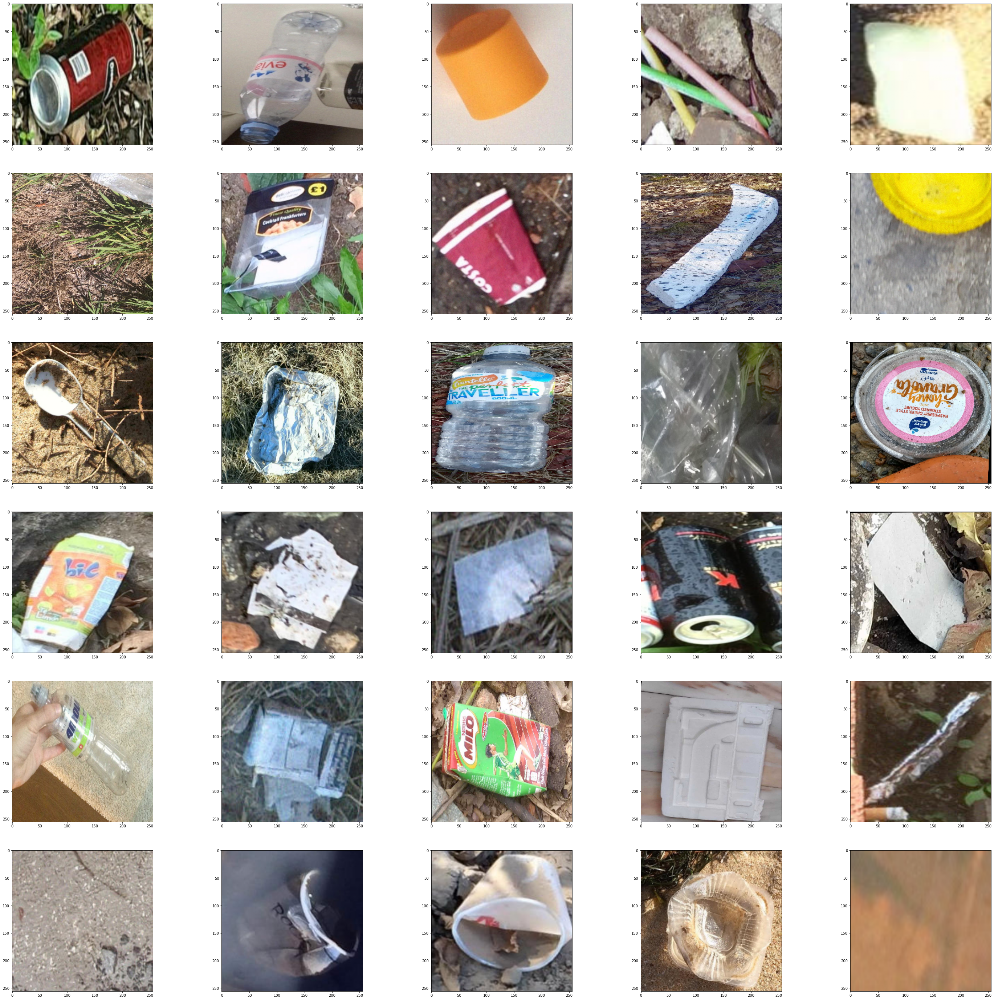

In [ ]:
fig = plt.figure(figsize=(50, 50))
k = 0
for i in range(30):
        ax = fig.add_subplot(6, 5, k+1)
        plt.imshow(X_dataset_resized[i])
        k += 1

In [ ]:
X = copy.deepcopy(x_train_images)

In [ ]:
le = preprocessing.LabelEncoder()
y = le.fit_transform(y_train_images)
enc = preprocessing.OneHotEncoder()
enc.fit(y.reshape(-1, 1))
X=np.array(X)
y=np.array(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

In [ ]:
print("Length of training examples : {}".format(len(X_train) ))
print("Length of testing examples : {}".format(len(X_test) ))

Length of training examples : 29001
Length of testing examples : 7251


In [ ]:
y_train= y_train.reshape(len(y_train),-1)
y_test = y_test.reshape(len(y_test),-1)

print(X_train.shape)
print(y_train.shape)

print(X_test.shape)
print(y_test.shape)

(29001, 64, 64, 3)
(29001, 1)
(7251, 64, 64, 3)
(7251, 1)


In [ ]:
print(y_test[:10])

[[18]
 [15]
 [18]
 [11]
 [12]
 [16]
 [ 6]
 [ 5]
 [18]
 [ 0]]


In [ ]:
y_train =to_categorical(y_train)
y_test =to_categorical(y_test)

In [ ]:
y_train =enc.transform(y_train).toarray()
y_test =enc.transform(y_test).toarray()


In [ ]:
print(y_train.shape)
print(y_test.shape)

(29001, 19)
(7251, 19)


In [ ]:
# Define the model architecture
model = tf.keras.models.Sequential([
     # Convolutional layer 1
      tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(64, 64, 3)),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),

      # Convolutional layer 2
      tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),

      # Convolutional layer 3
      tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),

      # Convolutional layer 3
      tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
      tf.keras.layers.MaxPooling2D(2, 2),
      tf.keras.layers.Dropout(0.25),
      tf.keras.layers.BatchNormalization(),

      # Flatten the output from the convolutional layers
      tf.keras.layers.Flatten(),

      # Dense layer 1
      tf.keras.layers.Dense(512, activation='relu'),
      tf.keras.layers.Dropout(0.5),

      # Output layer
      tf.keras.layers.Dense(19, activation='softmax')
])

# Compile the model
optimizer = tf.keras.optimizers.Adam(lr=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_82 (Conv2D)          (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d_81 (MaxPoolin  (None, 31, 31, 32)       0         
 g2D)                                                            
                                                                 
 dropout_103 (Dropout)       (None, 31, 31, 32)        0         
                                                                 
 batch_normalization_42 (Bat  (None, 31, 31, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_83 (Conv2D)          (None, 29, 29, 64)        18496     
                                                                 
 max_pooling2d_82 (MaxPoolin  (None, 14, 14, 64)     

Epoch 1/50
117/117 [==============================] - 6s 22ms/step - loss: 3.0745 - accuracy: 0.1422 - val_loss: 3.7941 - val_accuracy: 0.0543
Epoch 2/50
117/117 [==============================] - 2s 16ms/step - loss: 2.4855 - accuracy: 0.2524 - val_loss: 3.5350 - val_accuracy: 0.0545
Epoch 3/50
117/117 [==============================] - 2s 16ms/step - loss: 2.1798 - accuracy: 0.3373 - val_loss: 3.6202 - val_accuracy: 0.0610
Epoch 4/50
117/117 [==============================] - 2s 16ms/step - loss: 1.8973 - accuracy: 0.4175 - val_loss: 3.3617 - val_accuracy: 0.0987
Epoch 5/50
117/117 [==============================] - 2s 16ms/step - loss: 1.6965 - accuracy: 0.4788 - val_loss: 2.1520 - val_accuracy: 0.3424
Epoch 6/50
117/117 [==============================] - 2s 16ms/step - loss: 1.6337 - accuracy: 0.5010 - val_loss: 1.7738 - val_accuracy: 0.4594
Epoch 7/50
117/117 [==============================] - 2s 16ms/step - loss: 1.4923 - accuracy: 0.5429 - val_loss: 1.5419 - val_accuracy: 0.5257

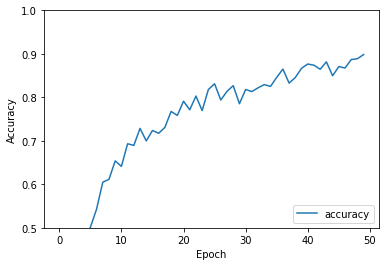

In [ ]:
history = model.fit(X_train, y_train, epochs=50, validation_data=(X_test, y_test), batch_size=250)

plt.plot(history.history['accuracy'], label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(X_test,  y_test, verbose=2)

In [ ]:
print(labels)

['aluminium_foil', 'carton', 'chips_bag', 'drink_carton', 'glass_bottle', 'metal_bottle_cap', 'metal_can', 'paper', 'paper_cup', 'paper_tissues', 'plastic_bag', 'plastic_bottle', 'plastic_bottle_cap', 'plastic_container', 'plastic_cup', 'plastic_lid', 'plastic_straw', 'plastic_tableware', 'styrofoam']


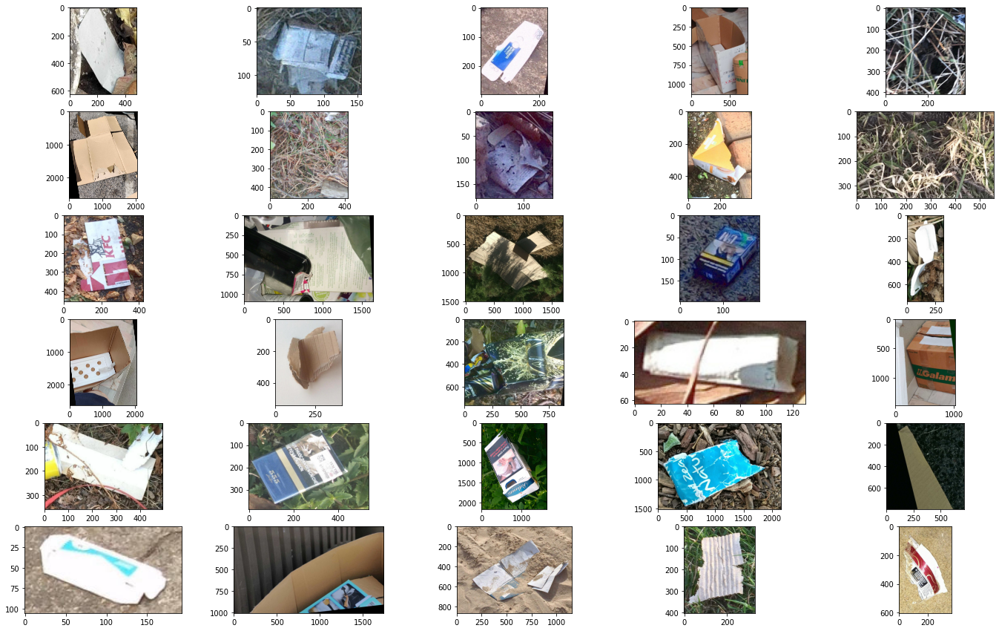

In [ ]:

fig = plt.figure(figsize=(24, 15))
k = 0
for i in range(30):
        ax = fig.add_subplot(6, 5, k+1)
        plt.imshow(data_set_dict["carton"][i])
        k += 1

In [ ]:
img = Image.open("/content/2.jpeg")
imgarr = np.array(img)
imgg= cv2.resize(imgarr,(64,64))/255
imgg=np.expand_dims(imgg, 0)

print(imgg.shape)
predictions=model.predict(imgg)

predicted_labels = np.argmax(predictions, axis=1)
print(le.inverse_transform(predicted_labels))

(1, 64, 64, 3)
1/1 [==============================] - 0s 32ms/step
['carton']


In [ ]:
import matplotlib.pyplot as plt

# Afficher les premières images augmentées pour chaque classe
fig, axs = plt.subplots(len(labels), 5, figsize=(10, 50))
for i, label in enumerate(labels):
    axs[i, 0].imshow(data_set_dict[label][0])
    axs[i, 0].axis('off')
    axs[i, 0].set_title('Original')

    for j in range(4):
        axs[i, j+1].imshow(data_set_augmented[label][j])
        axs[i, j+1].axis('off')
        axs[i, j+1].set_title('Augmented {}'.format(j+1))
plt.show()
